In [107]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from langchain.prompts import ChatPromptTemplate
from langchain.output_parsers import ResponseSchema
from langchain.output_parsers import StructuredOutputParser

import tiktoken

In [108]:
def num_tokens_from_string(string: str, encoding_name: str) -> int:
    encoding = tiktoken.get_encoding(encoding_name)
    num_tokens = len(encoding.encode(string))
    return num_tokens


# Importing transcripts

In [109]:
df_transcripts = pd.read_csv('../../data/transcripts_2022_v2.csv')
df_transcripts.head()

,call_transcript,mood,agent_number,intention,resolution,Date
0,"Agent 1: Good morning, thank you for calling E...",angry,1,Feedback and Suggestions,resolved,2022-01-01 00:00:00.000000000
1,"Agent 2: Thank you for calling ElectricVolt, m...",happy,2,Technical Support and Troubleshooting,resolved,2022-01-01 08:44:41.081081081
2,"Agent 3: Thank you for calling ElectricVolt, m...",happy,3,Account Management,resolved,2022-01-01 17:29:22.162162162
3,"Agent 2: Thank you for calling ElectricVolt, m...",happy,2,Outages and Emergencies,resolved,2022-01-02 02:14:03.243243243
4,"Agent 1: Thank you for calling ElectricVolt, m...",angry,1,Billing and Payments,resolved,2022-01-02 10:58:44.324324324


In [110]:
df_intention = pd.read_excel('../../data/intention_calls_ee.xlsx', sheet_name='intention1')
df_intention

,ID,Intention Call Categories,Definition or Description
0,1,Billing and Payments,"Questions regarding the latest bill, payment i..."
1,2,Service Requests and Appointments,"Scheduling maintenance or repair, connection r..."
2,3,Outages and Emergencies,"Reporting power outages, electrical emergencie..."
3,4,Account Management,"Updating personal information, closing/opening..."
4,5,Technical Support and Troubleshooting,"Help with understanding meter readings, assist..."
5,6,Complaints and Grievances,"Lodging a complaint regarding service, billing..."
6,7,Inquiries and General Information,"Information about services and products, guida..."
7,8,Renewable Energy and Sustainability Programs,"Information on renewable energy options, enrol..."
8,9,Contractor and Partner Communications,"Communication with third-party contractors, ve..."
9,10,Regulatory Compliance and Legal Inquiries,"Information regarding regulatory compliances, ..."


In [111]:
df_transcripts.shape

(1000, 6)

In [112]:
num_tokens = []
for transcript in df_transcripts['call_transcript']:
    n_tokens = num_tokens_from_string(transcript, encoding_name="cl100k_base")
    num_tokens.append(n_tokens)


# General Plots and Visuals

Text(0.5, 1.0, 'Sentiment (Mood) distribution')

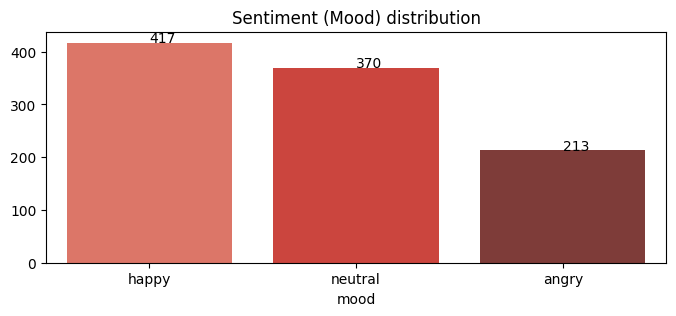

In [113]:
data = df_transcripts['mood'].value_counts()
plt.figure(figsize=(8, 3))
sns.barplot(x=data.index, y=data.values, palette="Reds_d")

#add values to the plot
for index, value in enumerate(data):
    plt.text(index, value, str(value))

#add title and labels
plt.title('Sentiment (Mood) distribution')

Text(0.5, 1.0, 'Agent distribution')

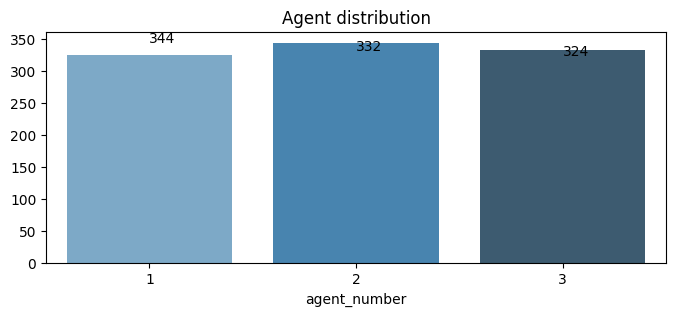

In [114]:
data = df_transcripts['agent_number'].value_counts()
plt.figure(figsize=(8, 3))
sns.barplot(x=data.index, y=data.values, palette="Blues_d")

#add values to the plot
for index, value in enumerate(data):
    plt.text(index, value, str(value))

#add title and labels
plt.title('Agent distribution')

Text(0.5, 1.0, 'Intention Calls Distribution')

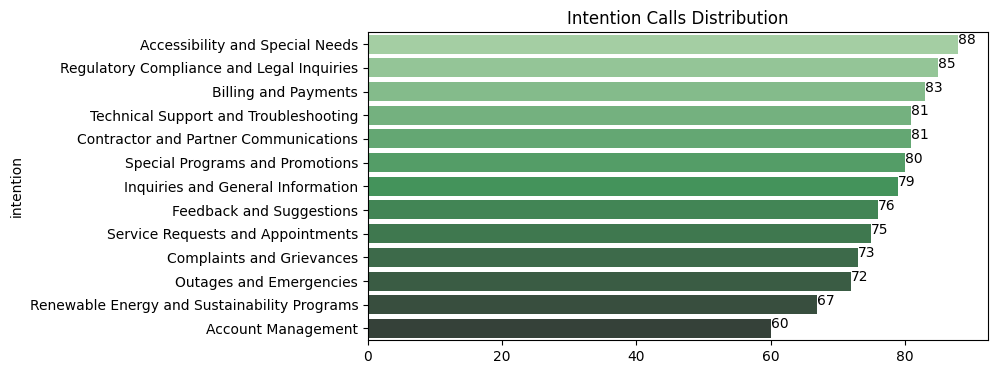

In [115]:
data = df_transcripts['intention'].value_counts()
plt.figure(figsize=(8, 4))
sns.barplot(y=data.index, x=data.values, palette="Greens_d")

#add values to the plot
for index, value in enumerate(data):
    plt.text(value, index, str(value))

#add title and labels
plt.title('Intention Calls Distribution')

Text(0.5, 1.0, 'Resolution distribution')

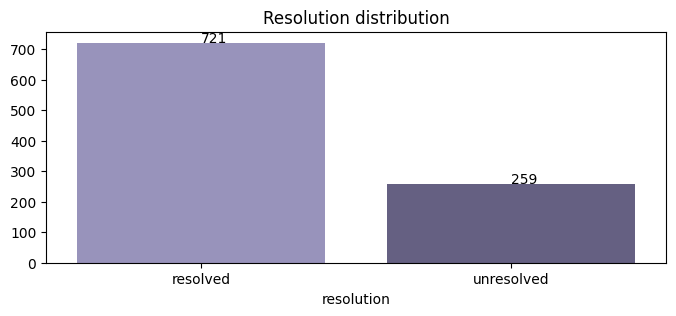

In [116]:
data = df_transcripts['resolution'].value_counts()
plt.figure(figsize=(8, 3))
sns.barplot(x=data.index, y=data.values, palette="Purples_d")

#add values to the plot
for index, value in enumerate(data):
    plt.text(index, value, str(value))

#add title and labels
plt.title('Resolution distribution')

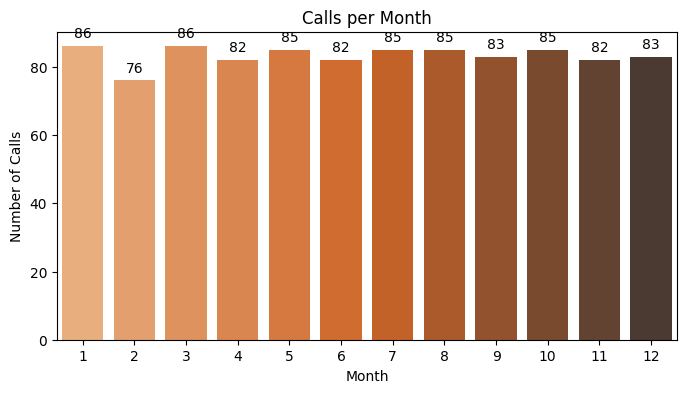

In [117]:
#change Date Column to datetime
df_transcripts['Date'] = pd.to_datetime(df_transcripts['Date'])

plt.figure(figsize=(8, 4))
ax = sns.countplot(x=df_transcripts['Date'].dt.month, palette="Oranges_d")

# Add values to each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

# Add title and labels
plt.title('Calls per Month')
plt.xlabel('Month')
plt.ylabel('Number of Calls')

plt.show()


# Tokens Analysis

/Users/urvog/miniconda3/envs/envCogniCall/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x300 with 0 Axes>

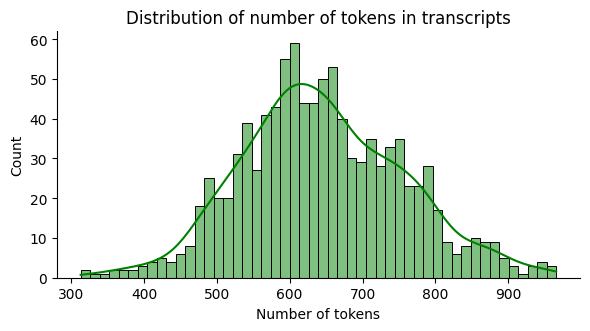

In [118]:
#distribution
plt.figure(figsize=(10, 3))
sns.displot(num_tokens, bins=50, kde=True, color='green', height=3, aspect=2)
plt.title('Distribution of number of tokens in transcripts')
plt.xlabel('Number of tokens')
plt.show()


<Axes: >

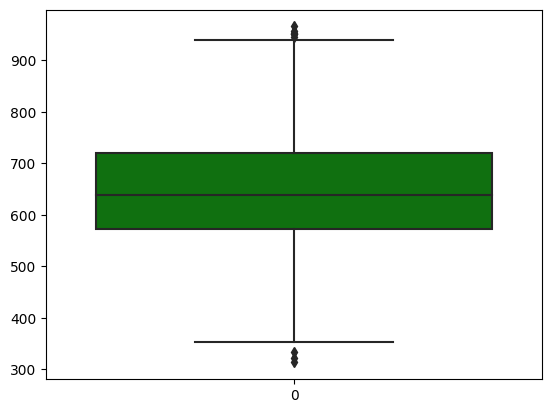

In [119]:
sns.boxplot(num_tokens, color='green')

# Prompts Analysis

## For Intention Calls Classification

In [120]:
prompt_template = ChatPromptTemplate.from_template(
"""
Based in the following transcript for a call center, classify the intention of the customer.

{transcript}

The possible intentions and their definitions or descriptions are the following:

{intentions}

If you can not classify the intention, you can use the "I don't know" option.

{format_instructions}

""")

In [121]:
#preparing schemas for output in JSON Format
intention_schema = ResponseSchema(name="intention",
                             description="""
                             The intention of customer call the posibble values are:%s"""
                             % str(list(df_intention['Intention Call Categories'])))
explanation_schema = ResponseSchema(name="explanation",
                                      description="""
                                      Explanation of the intention of customer call
                                      """)

response_schemas = [intention_schema, explanation_schema]
output_parser = StructuredOutputParser.from_response_schemas(response_schemas)
format_instructions = output_parser.get_format_instructions()

In [122]:
df_transcripts_clean = df_transcripts[['call_transcript']].copy()
df_transcripts_clean

num_tokens_intent_prompt = []

for transcript in df_transcripts_clean['call_transcript']:
    prompt_call = prompt_template.format_messages(transcript=transcript, 
                                              intentions=df_intention.iloc[:,1:],
                                              format_instructions=format_instructions)
    n_tokens_intent_prompt = num_tokens_from_string(prompt_call[0].content,encoding_name="cl100k_base")
    num_tokens_intent_prompt.append(n_tokens_intent_prompt)

/Users/urvog/miniconda3/envs/envCogniCall/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x300 with 0 Axes>

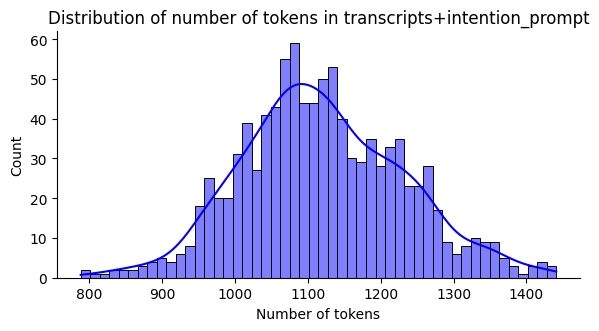

In [123]:
#distribution
plt.figure(figsize=(10, 3))
sns.displot(num_tokens_intent_prompt, bins=50, kde=True, color='Blue', height=3, aspect=2)
plt.title('Distribution of number of tokens in transcripts+intention_prompt')
plt.xlabel('Number of tokens')
plt.show()


<Axes: >

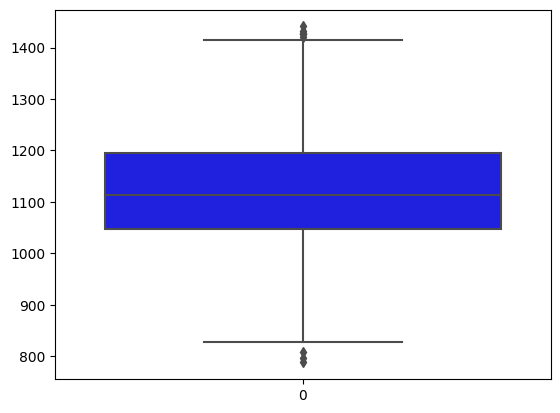

In [124]:
sns.boxplot(num_tokens_intent_prompt, color='blue')

## For Quality Check Calls Agent

In [125]:
df_script = pd.read_excel('../../data/scripts_call_center_ee.xlsx', sheet_name='general_script1')
df_script

,Step,Agent Script,Customer Response Options
0,Greeting,"""Good [morning/afternoon/evening], thank you f...",-
1,Identify Issue,"""Could you please tell me about the issue you'...","""[Describe issue]"""
2,Confirm Account Details,"""May I have your name and account number to pu...","""[Provide name and account number]"""
3,Verify Identity,"""For security, can you confirm your billing ad...","""[Provide verification information]"""
4,Analyze Issue,"""Thank you for that information. Let me review...",-
5,Provide Solution,"""I've looked into your issue, and it appears t...","""Yes/No"""
6,Schedule Technician,"""Would you like me to schedule a technician to...","""[Provide date and time]"""
7,Confirm Resolution,"""I have scheduled the technician for [date/tim...","""No, thank you"" / ""Yes, [describe other issue]"""
8,Closing,"""Thank you for calling [Company Name]. Have a ...","""Thank you, goodbye"""


In [126]:
prompt_template = ChatPromptTemplate.from_template(
"""
Based in the following transcript for a call center in electrical company:

{transcript}

Provide an score between 1 - 5 if following Script Quality Criteria is fulfilled:

{script_quality_criteria}

If you can't apply a criteria the check is False and the score is 0.

The ouput will be a JSON file with scores for each criteria (step) found in the transcript:

{format_instructions}

""")

In [127]:
#preparing schemas for output in JSON Format
QA01_Greeting_schema = ResponseSchema(name="qa01_greeting_schema",
                             description="""
                             Return an score from 1 to 5 based in the quality of the greeting criteria, 
                             return 0 if the greeting is not correct or not exist

                             The Score will be based in the following Agent Script: %s
                             
                             """
                             % str(df_script['Agent Script'][0]))

QA02_Identify_schema = ResponseSchema(name="qa02_identify_schema",
                             description="""
                             Return an score from 1 to 5 based in the quality  of the identification criteria, 
                             return 0 if the identification is not correct or not exist

                             The Score will be based in the following Agent Script: %s
                             """
                             % str(df_script['Agent Script'][1]))

QA03_confirm_schema = ResponseSchema(name="qa03_confirm_schema",
                             description="""
                             Return an score from 1 to 5 based in the quality of the confirmation criteria,
                             return 0 if the confirmation is not correct or not exist

                             The Score will be based in the following Agent Script: %s
                             """
                             % str(df_script['Agent Script'][2]))      

QA04_verify_schema = ResponseSchema(name="qa04_verify_schema",
                             description="""
                             Return an score from 1 to 5 based in the quality of the verification criteria,
                             return 0 if the verification is not correct or not exist

                             The Score will be based in the following Agent Script: %s
                             """
                             % str(df_script['Agent Script'][3]))      

QA05_analyze_schema = ResponseSchema(name="qa05_analyze_schema",
                             description="""
                             Return an score from 1 to 5 based in the quality of the analysis criteria,
                             return 0 if the analysis is not correct or not exist

                             The Score will be based in the following Agent Script: %s
                             """
                             % str(df_script['Agent Script'][4]))                      

QA06_solution_schema = ResponseSchema(name="qa06_solution_schema",
                             description="""
                             Return an score from 1 to 5 based in the quality of the solution criteria,
                             return 0 if the solution is not correct or not exist

                             The Score will be based in the following Agent Script: %s
                             """
                             % str(df_script['Agent Script'][5]))     

QA07_schedule_schema = ResponseSchema(name="qa07_schedule_schema",
                             description="""
                             Return an score from 1 to 5 based in the quality of the schedule criteria,
                             return 0 if the schedule is not correct or not exist

                             The Score will be based in the following Agent Script: %s
                             """
                             % str(df_script['Agent Script'][6]))       

QA08_resolution_schema = ResponseSchema(name="qa08_resolution_schema",
                             description="""
                             Return an score from 1 to 5 based in the quality of the resolution criteria,
                             return 0 if the resolution is not correct or not exist

                             The Score will be based in the following Agent Script: %s
                             """
                             % str(df_script['Agent Script'][7]))         

QA09_closing_schema = ResponseSchema(name="qa09_closing_schema",
                             description="""
                             Return an score from 1 to 5 based in the quality of the closing criteria,
                             return 0 if the closing is not correct or not exist

                             The Score will be based in the following Agent Script: %s
                             """
                             % str(df_script['Agent Script'][8]))          

response_schemas = [QA01_Greeting_schema, QA02_Identify_schema, QA03_confirm_schema, 
                    QA04_verify_schema, QA05_analyze_schema, QA06_solution_schema, 
                    QA07_schedule_schema, QA08_resolution_schema, QA09_closing_schema]
output_parser = StructuredOutputParser.from_response_schemas(response_schemas)
format_instructions = output_parser.get_format_instructions()

In [137]:
output_score_list = []
transcript_number = 1
tokens_list = []

num_tokens_quality_prompt = []

for transcript in df_transcripts['call_transcript']:
    prompt_call = prompt_template.format_messages(transcript=transcript, 
                                              script_quality_criteria=df_script,
                                              format_instructions=format_instructions)
    n_tokens_intent_prompt = num_tokens_from_string(prompt_call[0].content,encoding_name="cl100k_base")
    num_tokens_quality_prompt.append(n_tokens_intent_prompt)


Based in the following transcript for a call center in electrical company:

Agent 1: Good morning, thank you for calling ElectricVolt. My name is Agent 1, how can I assist you today?

Customer: Finally, someone answered! I've been trying to reach your company for days now. I am extremely angry with the service I received!

Agent 1: I apologize for the inconvenience, sir. Could you please provide me with your name and account details so that I can better assist you?

Customer: My name is John Smith and my account number is 123456789.

Agent 1: Thank you, Mr. Smith. I'm sorry to hear about your frustration. Could you please share the details of the service issue you experienced?

Customer: Well, I had an electrician from your company come to my house last week to fix some faulty wiring. Not only did they arrive late, but they also left without completing the job properly. I'm still having issues with my electrical system!

Agent 1: I understand your frustration, Mr. Smith. I apologize f

/Users/urvog/miniconda3/envs/envCogniCall/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 1000x300 with 0 Axes>

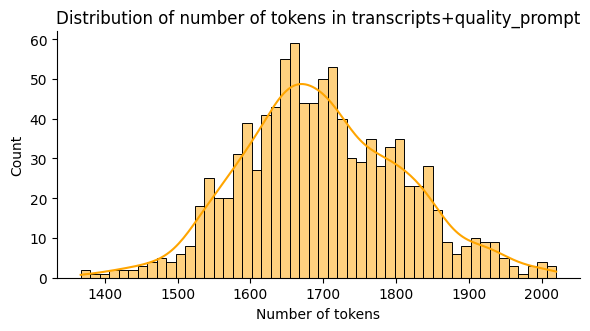

In [129]:
#distribution
plt.figure(figsize=(10, 3))
sns.displot(num_tokens_quality_prompt, bins=50, kde=True, color='Orange', height=3, aspect=2)
plt.title('Distribution of number of tokens in transcripts+quality_prompt')
plt.xlabel('Number of tokens')
plt.show()


<Axes: >

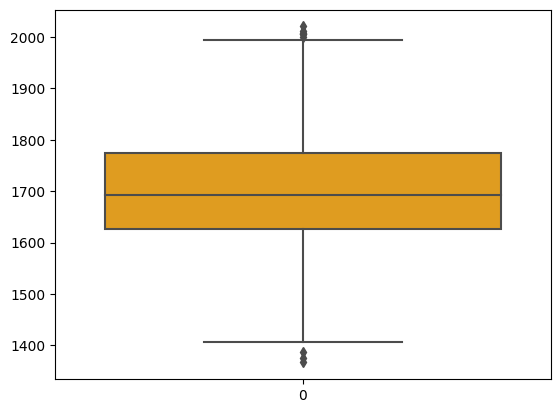

In [130]:
sns.boxplot(num_tokens_quality_prompt, color='Orange')

## Overall Prompts

In [131]:
df_prompts = pd.DataFrame([num_tokens,num_tokens_intent_prompt]).T
df_prompts.columns = ['num_tokens','num_tokens_intent_prompt']
df_prompts['diff_intent_prompt'] = df_prompts['num_tokens_intent_prompt'] - df_prompts['num_tokens']
df_prompts['num_tokens_quality_prompt'] = num_tokens_quality_prompt
df_prompts['diff_quality_prompt'] = df_prompts['num_tokens_quality_prompt'] - df_prompts['num_tokens']
df_prompts['total_tokens'] = df_prompts['num_tokens_intent_prompt']+df_prompts['num_tokens_quality_prompt']
df_prompts

,num_tokens,num_tokens_intent_prompt,diff_intent_prompt,num_tokens_quality_prompt,diff_quality_prompt,total_tokens
0,663,1138,475,1717,1054,2855
1,643,1118,475,1697,1054,2815
2,512,987,475,1566,1054,2553
3,632,1107,475,1686,1054,2793
4,781,1256,475,1835,1054,3091
...,...,...,...,...,...,...
995,649,1124,475,1703,1054,2827
996,580,1055,475,1634,1054,2689
997,692,1167,475,1746,1054,2913
998,583,1058,475,1637,1054,2695


In [132]:
df_prompts.sum()

num_tokens                    644857
num_tokens_intent_prompt     1119857
diff_intent_prompt            475000
num_tokens_quality_prompt    1698857
diff_quality_prompt          1054000
total_tokens                 2818714
dtype: int64

## Estimating Costs

In [133]:
print("Total Tokens Prompts")
df_prompts.sum()

Total Tokens Prompts


num_tokens                    644857
num_tokens_intent_prompt     1119857
diff_intent_prompt            475000
num_tokens_quality_prompt    1698857
diff_quality_prompt          1054000
total_tokens                 2818714
dtype: int64

In [134]:
print("Total estimated Costs for gpt-3.5-turbo-16k model")
df_prompts.sum()/1000*0.004

Total estimated Costs for gpt-3.5-turbo-16k model


num_tokens                    2.579428
num_tokens_intent_prompt      4.479428
diff_intent_prompt            1.900000
num_tokens_quality_prompt     6.795428
diff_quality_prompt           4.216000
total_tokens                 11.274856
dtype: float64

In [135]:
print("Total estimated Costs per 1K for gpt-3.5-turbo 4K model")
df_prompts.sum()/1000*0.002

Total estimated Costs per 1K for gpt-3.5-turbo 4K model


num_tokens                   1.289714
num_tokens_intent_prompt     2.239714
diff_intent_prompt           0.950000
num_tokens_quality_prompt    3.397714
diff_quality_prompt          2.108000
total_tokens                 5.637428
dtype: float64

In [136]:
print("Total estimated Costs for gpt-4-8k model")
df_prompts.sum()/1000*0.05

Total estimated Costs for gpt-4-8k model


num_tokens                    32.24285
num_tokens_intent_prompt      55.99285
diff_intent_prompt            23.75000
num_tokens_quality_prompt     84.94285
diff_quality_prompt           52.70000
total_tokens                 140.93570
dtype: float64